# COVID IIMPACT ON NORTHERN VA TRAFFIC ACCIDENTS

## IMPORT LIBRARIES

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
import datetime
from datetime import date
%matplotlib inline

## IMPORT DATA

In [3]:
rawdata=pd.read_csv(r"C:\Users\proce\Documents\IBM Capstone\Final Project\CSV Files\US_Accidents_Dec20.csv")

In [4]:
rawdata.shape

(4232541, 49)

## ANALYZE & CLEAN DATA

In [5]:
### Idenitfy columns with large amount of missing information
rawdata.isna().sum()

ID                             0
Source                         0
TMC                      1516064
Severity                       0
Start_Time                     0
End_Time                       0
Start_Lat                      0
Start_Lng                      0
End_Lat                  2716477
End_Lng                  2716477
Distance(mi)                   0
Description                    2
Number                   2687949
Street                         0
Side                           0
City                         137
County                         0
State                          0
Zipcode                     1292
Country                        0
Timezone                    4615
Airport_Code                8973
Weather_Timestamp          62644
Temperature(F)             89900
Wind_Chill(F)            1896001
Humidity(%)                95467
Pressure(in)               76384
Visibility(mi)             98668
Wind_Direction             83611
Wind_Speed(mph)           479326
Precipitat

In [8]:
### Filter dataframe to only include key columns
rawdata=rawdata[['Source', 'Severity', 'Start_Time', 'End_Time',
       'Start_Lat', 'Start_Lng', 'Distance(mi)',
       'Description','Street', 'Side', 'City', 'County', 'State',
       'Zipcode', 'Timezone', 'Weather_Condition', 'Amenity', 'Bump', 'Crossing',
       'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station',
       'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
       'Sunrise_Sunset']]

In [9]:
### Filter Dataframe to only include data from Virginia 
rawdata=rawdata[rawdata['State'].str.contains('VA')]

In [10]:
rawdata.shape

(127949, 30)

In [11]:
### List all cities in Viriginia to determine cities to include in NOVA dataframe
VAcities=rawdata['City'].unique()
VAcities.sort()
VAcities

array(['Abingdon', 'Accomac', 'Afton', 'Alberta', 'Aldie', 'Alexandria',
       'Altavista', 'Alton', 'Amelia Court House', 'Amherst',
       'Amissville', 'Annandale', 'Appalachia', 'Appomattox', 'Ararat',
       'Arlington', 'Aroda', 'Arrington', 'Arvonia', 'Ashburn', 'Ashland',
       'Atkins', 'Austinville', 'Axton', 'Aylett', 'Bandy',
       'Barboursville', 'Barhamsville', 'Barren Springs', 'Baskerville',
       'Bassett', 'Bastian', 'Bealeton', 'Beaverdam', 'Bedford', 'Bee',
       'Belle Haven', 'Bent Mountain', 'Bentonville', 'Bermuda',
       'Berryville', 'Big Island', 'Big Stone Gap', 'Birdsnest',
       'Blacksburg', 'Blackstone', 'Blairs', 'Bland', 'Bloxom',
       'Blue Ridge', 'Bluefield', 'Bluemont', 'Boones Mill', 'Boston',
       'Bowling Green', 'Boyce', 'Boydton', 'Boykins', 'Bracey',
       'Brandy Station', 'Bremo Bluff', 'Bridgewater', 'Brightwood',
       'Bristol', 'Bristow', 'Broad Run', 'Broadlands', 'Broadway',
       'Brodnax', 'Brookneal', 'Buchanan', 'Bu

## CREATE & CLEAN NEW DATAFRAME: NOVA

In [12]:
### Create Dataframe that only includes data from key Northern VA cities
nova=rawdata[rawdata['City'].str.contains 
('Arlington|Reston|Alexandria|Farifax|Falls Church|Springfield|Ashburn|Chantilly|Fort Belvoir|Herndon|Mc Lean|Vienna')]

In [13]:
nova.shape

(17561, 30)

#### CATEGORIZE WEATHER CONDITIONS INTO 6 MAIN CATEGORIES

In [14]:
nova.Weather_Condition.value_counts()

Mostly Cloudy                   3774
Fair                            2317
Overcast                        2292
Partly Cloudy                   2197
Clear                           1963
Cloudy                          1626
Scattered Clouds                1249
Light Rain                      1174
Rain                             236
Light Drizzle                    132
Heavy Rain                        80
Fog                               70
Light Snow                        69
Mostly Cloudy / Windy             33
Fair / Windy                      30
Partly Cloudy / Windy             29
Haze                              28
Wintry Mix                        28
Patches of Fog                    21
Light Thunderstorms and Rain      18
Thunder                           16
Light Rain with Thunder           16
Thunder in the Vicinity           15
Heavy Thunderstorms and Rain      13
Thunderstorm                      12
T-Storm                           10
Shallow Fog                        5
H

In [16]:
### Category 1: Overcast
nova.loc[:,'Weather_Condition']=nova.loc[:,'Weather_Condition'].replace(['Overcast','Mostly Cloudy','Partly Cloudy','Mostly Cloudy / Windy','Partly Cloudy / Windy','Cloudy','Cloudy / Windy','Scattered Clouds',],'Overcast')

In [17]:
### Category 2: Fair
nova.loc[:,'Weather_Condition']=nova.loc[:,'Weather_Condition'].replace(['Fair','Clear','Fair / Windy',],'Fair')

In [18]:
### Category 3: Rain
nova.loc[:,'Weather_Condition']=nova.loc[:,'Weather_Condition'].replace(['Light Rain','Rain','Light Drizzle','Light Rain with Thunder','Mist', 'Rain / Windy','Drizzle', 'Light Rain / Windy'],'Rain')

In [19]:
### Category 4: Storm
nova.loc[:,'Weather_Condition']=nova.loc[:,'Weather_Condition'].replace(['Heavy Rain','Thunder','Light Thunderstorms and Rain',
                                                                        'Thunder in the Vicinity','Heavy Thunderstorms and Rain',
                                                                        'Thunderstorm','T-Storm','Heavy T-Storm','Thunderstorms and Rain',
                                                                        'Heavy T-Storm / Windy','Thunder / Windy'],'Storm')

In [20]:
### Category 5: Fog
nova.loc[:,'Weather_Condition']=nova.loc[:,'Weather_Condition'].replace(['Fog','Haze','Patches of Fog','Shallow Fog',
                                                                         'Light Freezing Fog'],'Fog')

In [21]:
### Category 6: Winter Conditions
nova.loc[:,'Weather_Condition']=nova.loc[:,'Weather_Condition'].replace(['Light Snow','Wintry Mix','Snow','Light Ice Pellets',
                                                                        'Light Freezing Rain','Light Freezing Rain / Windy',
                                                                        'Light Snow and Sleet','Ice Pellets','Light Freezing Drizzle']
                                                                       ,'Winter Conditions')

In [22]:
### Get a count on the newly created weather categories
nova.Weather_Condition.value_counts()

Overcast             11205
Fair                  4310
Rain                  1568
Storm                  175
Fog                    126
Winter Conditions      113
Name: Weather_Condition, dtype: int64

#### SPLIT START_TIME

In [24]:
### Split Start_time to seperate the date and time into seperate columns to make future filtering easier 
nova[['Date','Time']] = nova.Start_Time.str.split(" ",expand=True)

#### SPLIT NOVA DATAFRAME INTO 2019 & 2020 DATAFRAMES

In [25]:
#### Create dataframe that includes data from key cities in 2019
nova2019=nova[nova['Start_Time'].str.contains('2019')]

In [26]:
### Create data frame that includes data from key cities in 2020
nova2020=nova[nova['Start_Time'].str.contains('2020')]

#### CONVERT TYPES IN EACH DATAFRAME

In [28]:
### Covert types to datetime for columns with date information
### Input Quarter and Month columns w/ appropriate information 
nova.loc[:,'Start_Time']=nova.Start_Time.astype('datetime64')
nova.loc[:,'End_Time']=nova.End_Time.astype('datetime64')
nova.loc[:,'Date']=nova.End_Time.astype('datetime64')
nova.loc[:,'Time']=nova.End_Time.astype('datetime64')
nova.loc[:,'Quarter']=nova.Start_Time.dt.quarter
nova.loc[:,'Month']=nova.Start_Time.dt.month

In [29]:
### Repeat same process above for the 2019 df

nova2019.loc[:,'Start_Time']=nova2019.Start_Time.astype('datetime64')
nova2019.loc[:,'End_Time']=nova2019.End_Time.astype('datetime64')
nova2019.loc[:,'Date']=nova.Date.astype('datetime64')
nova2019.loc[:,'Time']=nova.Time.astype('datetime64')
nova2019.loc[:,'Quarter']=nova2019.Start_Time.dt.quarter
nova2019.loc[:,'Month']=nova2019.Start_Time.dt.month

In [30]:
### Repeat same process above for the 2020 df

nova2020.loc[:,'Start_Time']=nova2020.Start_Time.astype('datetime64')
nova2020.loc[:,'End_Time']=nova2020.End_Time.astype('datetime64')
nova2019.loc[:,'Date']=nova.Date.astype('datetime64')
nova2019.loc[:,'Time']=nova.Time.astype('datetime64')
nova2020.loc[:,'Quarter']=nova2020.Start_Time.dt.quarter
nova2020.loc[:,'Month']=nova2020.Start_Time.dt.month

In [31]:
nova2019.dtypes

Source                       object
Severity                      int64
Start_Time           datetime64[ns]
End_Time             datetime64[ns]
Start_Lat                   float64
Start_Lng                   float64
Distance(mi)                float64
Description                  object
Street                       object
Side                         object
City                         object
County                       object
State                        object
Zipcode                      object
Timezone                     object
Weather_Condition            object
Amenity                        bool
Bump                           bool
Crossing                       bool
Give_Way                       bool
Junction                       bool
No_Exit                        bool
Railway                        bool
Roundabout                     bool
Station                        bool
Stop                           bool
Traffic_Calming                bool
Traffic_Signal              

## 2019 VS 2020 COMPARISONS

#### TOTAL ACCIDENTS BY CITY

In [32]:
### 2019 Total accidents filtered by city
city2019=nova2019.City.value_counts().sort_index()

In [33]:
### 2020 Total accidents filtered by city
city2020=nova2020.City.value_counts().sort_index()

In [34]:
cities=pd.DataFrame({'2019':city2019,'2020':city2020})

In [35]:
citieswchange=pd.DataFrame({'2019':city2019,'2020':city2020,'Percent_Change':(city2020-city2019)/city2019*100})

In [36]:
citieswchange

,2019,2020,Percent_Change
Alexandria,724,1118,54.419890
Arlington,511,1153,125.636008
Ashburn,210,126,-40.000000
Chantilly,141,270,91.489362
Falls Church,338,651,92.603550
Fort Belvoir,4,21,425.000000
Herndon,35,77,120.000000
Mc Lean,332,554,66.867470
Reston,31,99,219.354839
Springfield,451,905,100.665188


In [37]:
cities.head(10)

,2019,2020
Alexandria,724,1118
Arlington,511,1153
Ashburn,210,126
Chantilly,141,270
Falls Church,338,651
Fort Belvoir,4,21
Herndon,35,77
Mc Lean,332,554
Reston,31,99
Springfield,451,905


In [38]:
citieswchange.sum()

2019              2901.000000
2020              5236.000000
Percent_Change    1367.326629
dtype: float64

In [39]:
citieswchange['Percent_Change'].mean()

124.30242081531308

Text(0.5, 0, 'Year')

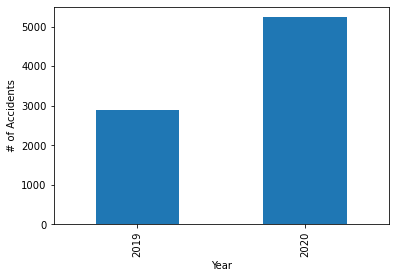

In [40]:
cities.sum().plot(kind='bar')
plt.ylabel('# of Accidents')
plt.xlabel('Year')

Text(0.5, 0, 'City')

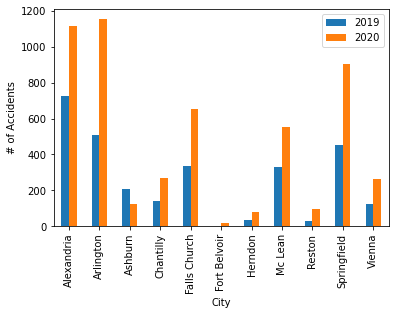

In [41]:
cities.plot(kind='bar')
plt.ylabel('# of Accidents')
plt.xlabel('City')

#### TOTAL ACCIDENTS BY QUARTER

In [42]:
### 2019 Total accidents filtered by quarter
nova19qtr=nova2019.Quarter.value_counts().sort_index()

In [43]:
nova19qtr

1    864
2    797
3    615
4    625
Name: Quarter, dtype: int64

In [44]:
### 2020 Total accidents filtered by quarter
nova2020qtr=nova2020.Quarter.value_counts().sort_index()

In [45]:
qtrcomp=pd.DataFrame({'2019':nova19qtr,'2020':nova2020qtr})

In [50]:
### create dataframe that inlcudes the % change between the quarters
qtrcompwchange=pd.DataFrame({'2019':nova19qtr,'2020':nova2020qtr,'Percent_Change':(nova2020qtr-nova19qtr)/nova19qtr*100})

In [51]:
qtrcompwchange

,2019,2020,Percent_Change
1,864,670,-22.453704
2,797,1103,38.393977
3,615,660,7.317073
4,625,2803,348.480000


In [52]:
qtrcompwchange.mean()

2019               725.250000
2020              1309.000000
Percent_Change      92.934337
dtype: float64

<AxesSubplot:>

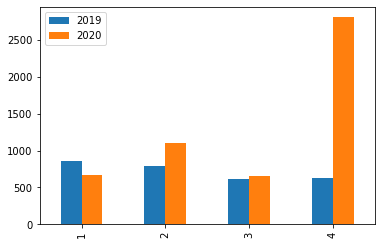

In [166]:
qtrcomp.plot(kind='bar')

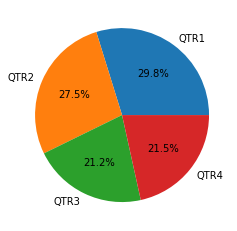

In [167]:
my_labels=('QTR1','QTR2','QTR3','QTR4')
plt.pie(qtrcomp['2019'],labels=my_labels,autopct='%1.1f%%')
plt.title=('2019 Accidents by Quarter')
plt.axis=('equal')
plt.show()

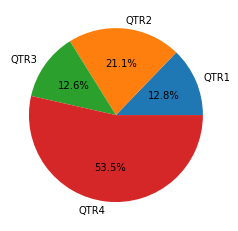

In [168]:
my_labels=('QTR1','QTR2','QTR3','QTR4')
plt.pie(qtrcomp['2020'],labels=my_labels,autopct='%1.1f%%')
plt.title=('2020 Accidents by Quarter')
plt.axis=('equal')
plt.show()

#### TOTAL ACCIDENTS BY MONTH

In [169]:
### 2019 Total accidents filtred by month
nova19bymonth =nova2019.Month.value_counts().sort_index()

In [170]:
### 2020 Total accidents filtered by month
nova20bymonth=nova2020.Month.value_counts().sort_index()

In [171]:
bymonth=pd.DataFrame({'2019':nova19bymonth,'2020':nova20bymonth})

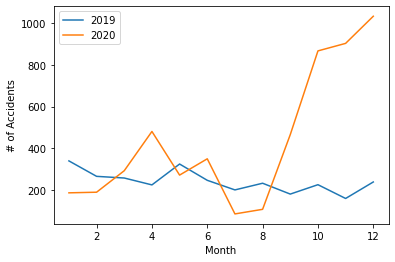

In [172]:
bymonth.plot(kind='line')
plt.ylabel('# of Accidents')
plt.xlabel('Month')
plt.title=('Accidents by Month')


<AxesSubplot:>

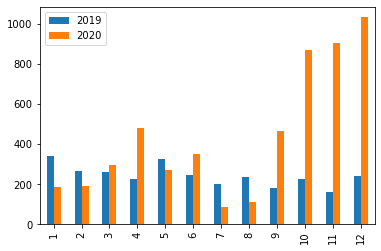

In [173]:
bymonth.plot(kind='bar')

#### DAY VS NIGHT

In [54]:
nova19dn=nova2019.Sunrise_Sunset.value_counts().sort_index()

In [55]:
nova20dn=nova2020.Sunrise_Sunset.value_counts().sort_index()

In [56]:
dayvsnight=pd.DataFrame({'2019':nova19dn,'2020':nova20dn})

In [57]:
dayvsnight

,2019,2020
Day,2201,2751
Night,700,2485


In [59]:
dayvsnightwchange=pd.DataFrame({'2019':nova19dn,'2020':nova20dn,'Percent_Change':(nova20dn-nova19dn)/nova19dn*100})

In [60]:
dayvsnightwchange

,2019,2020,Percent_Change
Day,2201,2751,24.988642
Night,700,2485,255.000000


<AxesSubplot:>

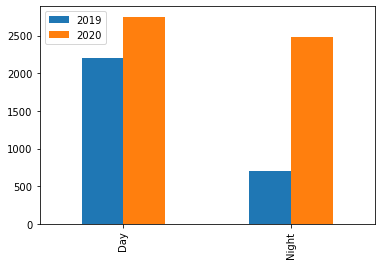

In [177]:
dayvsnight.plot(kind='bar')

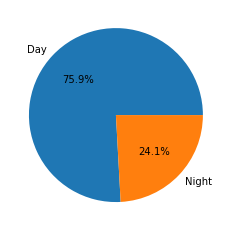

In [178]:
my_labels=('Day','Night')
plt.pie(dayvsnight['2019'],labels=my_labels,autopct='%1.1f%%')
plt.axis=('equal')
plt.show()

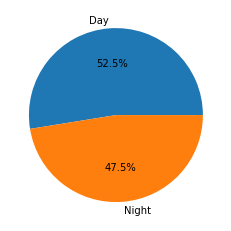

In [179]:
my_labels=('Day','Night')
plt.pie(dayvsnight['2020'],labels=my_labels,autopct='%1.1f%%')
plt.axis=('equal')
plt.show()

#### SEVERITY COMPARISON

In [62]:
nova19sev=nova2019.Severity.value_counts().sort_index()

In [63]:
nova20sev=nova2020.Severity.value_counts().sort_index()

In [64]:
severity=pd.DataFrame({'2019':nova19sev,'2020':nova20sev})

In [69]:
severitywchange=pd.DataFrame({'2019':nova19sev,'2020':nova20sev,'Percent_Change':(nova20sev-nova19sev)/nova19sev*100})

In [70]:
severitywchange

,2019,2020,Percent_Change
1,NaN,48,NaN
2,1403.0,3847,174.198147
3,1373.0,1190,-13.328478
4,125.0,151,20.800000


In [71]:
severitywchange.mean()

2019               967.000000
2020              1309.000000
Percent_Change      60.556556
dtype: float64

<AxesSubplot:>

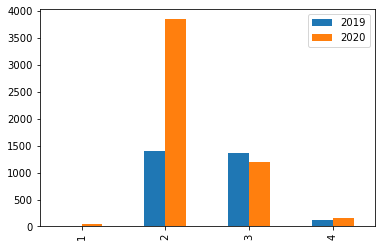

In [183]:
severity.plot(kind='bar')

#### WEATHER CONDITIONS COMPARISON

In [73]:
nova19weather=nova2019.Weather_Condition.value_counts().sort_index()

In [74]:
nova20weather=nova2020.Weather_Condition.value_counts().sort_index()

In [75]:
weather=pd.DataFrame({'2019':nova19weather,'2020':nova20weather})

In [76]:
weatherwchange=pd.DataFrame({'2019':nova19weather,'2020':nova20weather,'Percent_Change':(nova20weather-nova19weather)/nova19weather*100})

In [77]:
weatherwchange

,2019,2020,Percent_Change
Fair,746,1758,135.656836
Fog,46,30,-34.782609
Overcast,1824,2776,52.192982
Rain,214,552,157.943925
Storm,38,49,28.947368
Winter Conditions,24,39,62.500000


In [79]:
weatherwchange.mean()

2019              482.000000
2020              867.333333
Percent_Change     67.076417
dtype: float64

<AxesSubplot:>

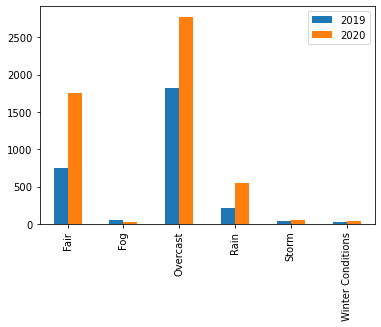

In [187]:
weather.plot(kind='bar')

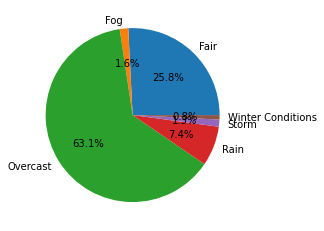

In [188]:
my_labels=('Fair','Fog','Overcast','Rain','Storm','Winter Conditions')
plt.pie(weather['2019'],labels=my_labels,autopct='%1.1f%%')
plt.axis=('equal')
plt.show()

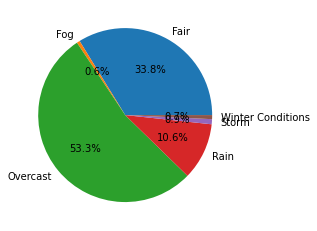

In [189]:
my_labels=('Fair','Fog','Overcast','Rain','Storm','Winter Conditions')
plt.pie(weather['2020'],labels=my_labels,autopct='%1.1f%%')
plt.axis=('equal')
plt.show()

#### Type of Roadway Comparison

#### Top 5 Cause Comparison

#### Rush Hour Comparison 

## MAPS

In [190]:
novamap= folium.Map(location=[38.8462, -77.3064],zoom_start=11)

novamap

In [191]:
### 2019 accidents mapped to Northern VA region
incidents2019 = folium.map.FeatureGroup()

# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in zip(nova2019.Start_Lat, nova2019.Start_Lng):
    incidents2019.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=3, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='red',
            fill_opacity=0.5
        )
    )

# add incidents to map
novamap.add_child(incidents2019)

In [192]:
novamapp= folium.Map(location=[38.8462, -77.3064],zoom_start=11)

novamapp

In [193]:
incidents2020 = folium.map.FeatureGroup()

# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in zip(nova2020.Start_Lat, nova2020.Start_Lng):
    incidents2020.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=3, # define how big you want the circle markers to be
            color='blue',
            fill=True,
            fill_color='red',
            fill_opacity=0.5
        )
    )

# add incidents to map
novamapp.add_child(incidents2020)

In [194]:
from folium import plugins

# let's start again with a clean copy of the map of Northern VA
novamap = folium.Map(location = [38.8462, -77.3064], zoom_start = 11)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(novamap)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(nova2019.Start_Lat, nova2019.Start_Lng, nova2019.City):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

novamap

In [195]:
from folium import plugins

# let's start again with a clean copy of the map of Northern VA
novamapp = folium.Map(location = [38.8462, -77.3064], zoom_start = 11)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(novamapp)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(nova2020.Start_Lat, nova2020.Start_Lng, nova2020.City):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

novamapp